Block: detected period = 1
Beehive: detected period = 1
Loaf: detected period = 1
Blinker: detected period = 2
Pulsar: detected period = 1
Pentadecathlon: detected period = 6
Glider: detected period = 80
MaxOccupancy: detected period = 1


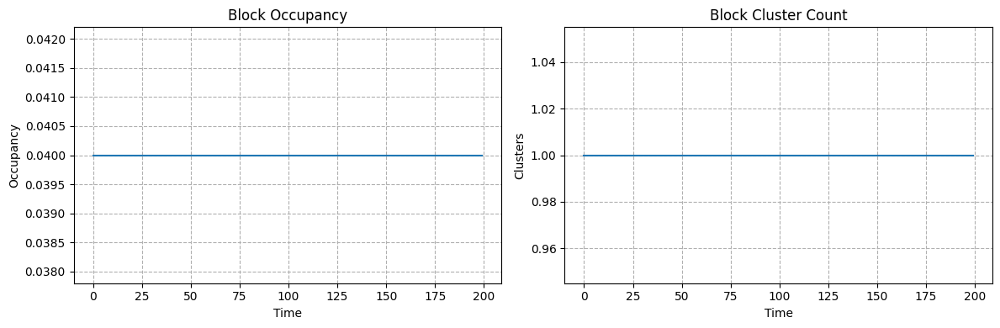

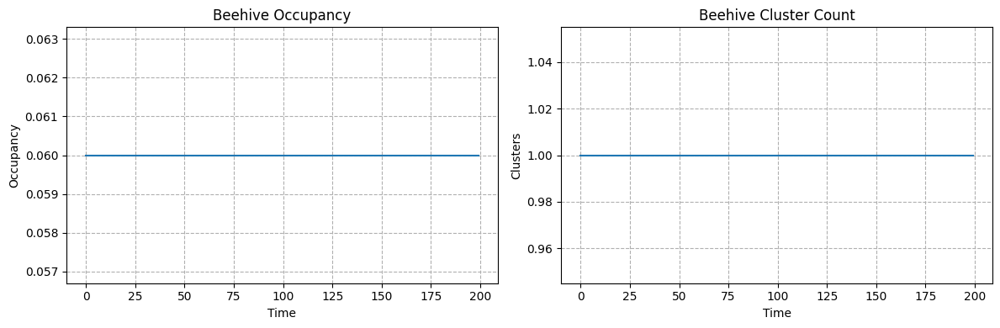

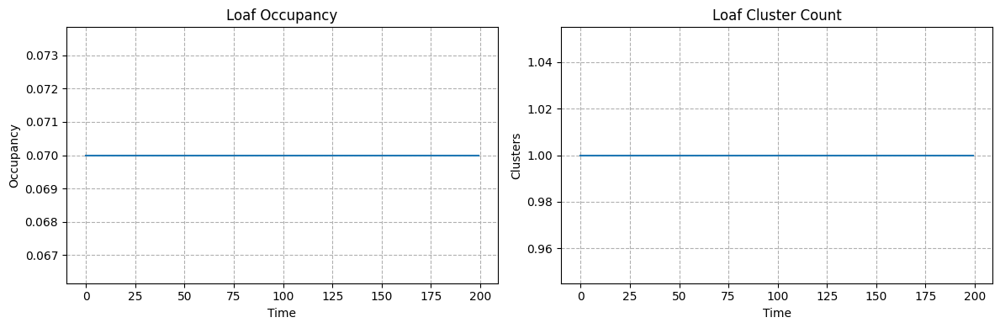

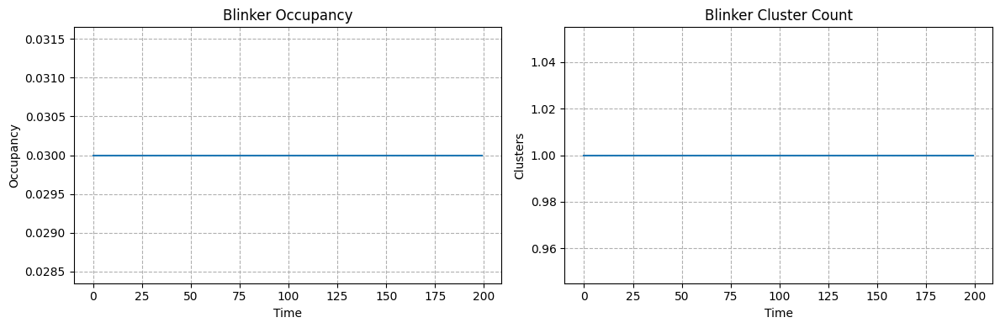

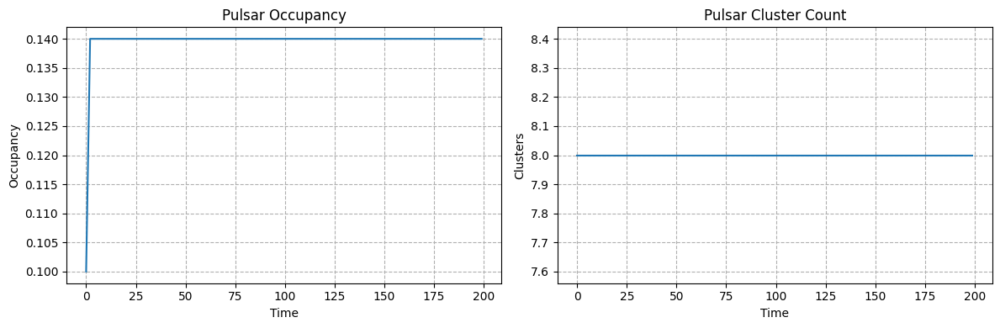

...

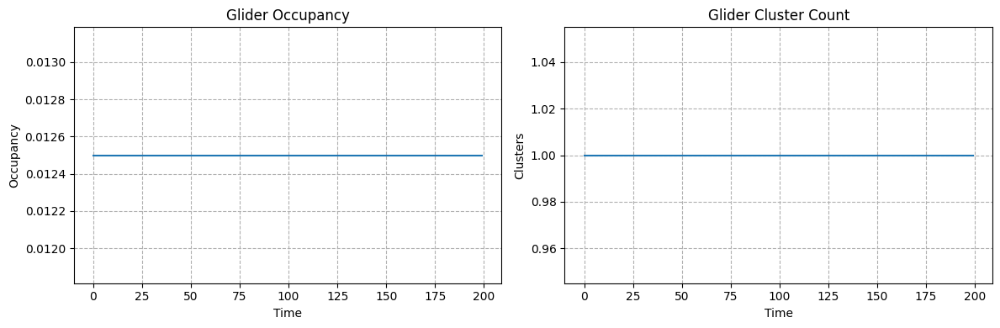

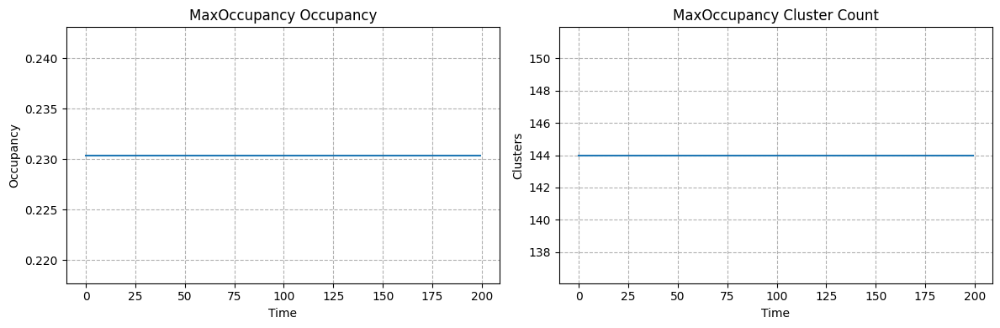

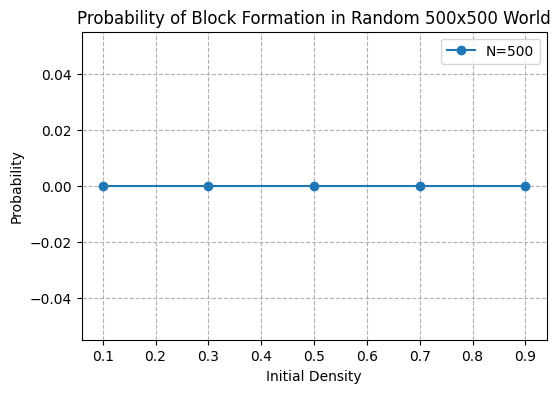

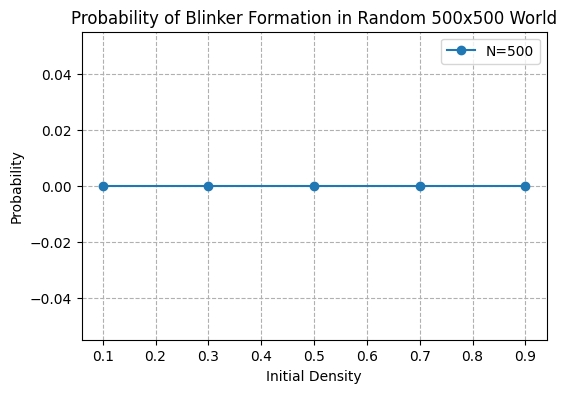

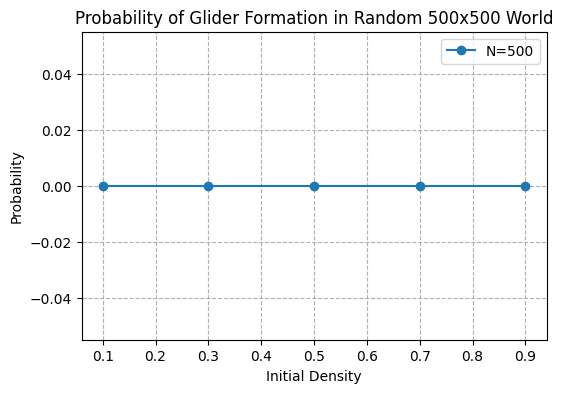

In [15]:
import numpy as np
import scipy.signal as scs
import matplotlib.pyplot as plt
from scipy.ndimage import label


def evolution(world, neighbours):
    new_world = np.zeros_like(world)
    survive = (world == 1) & ((neighbours == 2) | (neighbours == 3))
    born = (world == 0) & (neighbours == 3)
    new_world[survive | born] = 1
    return new_world, born.sum(), ((world == 1) & (new_world == 0)).sum()

def simulate(world, T, boundary='wrap'):
    kernel = np.ones((3,3))
    kernel[1,1] = 0
    alive_history, born_history, death_history = [], [], []
    for _ in range(T):
        neighbours = scs.convolve2d(world, kernel, mode='same', boundary=boundary)
        world, born, deaths = evolution(world, neighbours)
        alive_history.append(world.sum())
        born_history.append(born)
        death_history.append(deaths)
    return world, alive_history, born_history, death_history

def next_generation(world, boundary='wrap'):
    kernel = np.ones((3,3))
    kernel[1,1] = 0
    neighbours = scs.convolve2d(world, kernel, mode='same', boundary=boundary)
    new_world, _, _ = evolution(world, neighbours)
    return new_world

def count_clusters(world):
    structure = np.ones((3,3))
    labeled, num = label(world, structure=structure)
    return num

def center_of_mass(world):
    coords = np.argwhere(world == 1)
    if len(coords) == 0:
        return None
    return coords.mean(axis=0)

def detect_period(world, T=500):
    seen = {}
    kernel = np.ones((3,3))
    kernel[1,1] = 0
    for t in range(T):
        key = world.tobytes()
        if key in seen:
            return t - seen[key]
        seen[key] = t
        neighbours = scs.convolve2d(world, kernel, mode='same', boundary='wrap')
        world, _, _ = evolution(world, neighbours)
    return None


def block(N=10):
    grid = np.zeros((N,N), dtype=int)
    grid[2:4,2:4] = 1
    return grid

def beehive(N=10):
    grid = np.zeros((N,N), dtype=int)
    grid[4:7,3:7] = np.array([[0,1,1,0],[1,0,0,1],[0,1,1,0]])
    return grid

def loaf(N=10):
    grid = np.zeros((N,N), dtype=int)
    grid[3:7,3:7] = np.array([[0,1,1,0],[1,0,0,1],[0,1,0,1],[0,0,1,0]])
    return grid

def blinker(N=10):
    grid = np.zeros((N,N), dtype=int)
    grid[5,4:7] = 1
    return grid

def pulsar(N=20):
    grid = np.zeros((N,N), dtype=int)
    # Semplificazione pulsar centrale 13x13
    pattern = np.zeros((13,13), dtype=int)
    # riga/colonna centrale
    pattern[2:5,0:3] = 1
    pattern[2:5,10:13] = 1
    pattern[8:11,0:3] = 1
    pattern[8:11,10:13] = 1
    pattern[0:3,2:5] = 1
    pattern[0:3,8:11] = 1
    pattern[10:13,2:5] = 1
    pattern[10:13,8:11] = 1
    grid[3:16,3:16] = pattern
    return grid

def pentadecathlon(N=16):
    grid = np.zeros((N,N), dtype=int)
    grid[7,3:13] = [1,1,0,1,1,1,1,0,1,1]
    grid[8,3:13] = [0,0,1,0,0,0,0,1,0,0]
    grid[6,3:13] = [0,0,1,0,0,0,0,1,0,0]
    return grid

def glider(N=20):
    grid = np.zeros((N,N), dtype=int)
    pattern = np.array([[0,1,0],[0,0,1],[1,1,1]])
    grid[5:8,5:8] = pattern
    return grid

def gridmax(N):
    grid = np.zeros((N,N), dtype=int)
    grid[2::4,1::2] = 1
    grid[1::2,2::4] = 1
    return grid

patterns = {
    "Block": block(10),
    "Beehive": beehive(10),
    "Loaf": loaf(10),
    "Blinker": blinker(10),
    "Pulsar": pulsar(20),
    "Pentadecathlon": pentadecathlon(16),
    "Glider": glider(20),
    "MaxOccupancy": gridmax(50)
}


T = 200
results = {}

for name, world in patterns.items():
    final, alive, born, death = simulate(world.copy(), T)
    occupancy = np.array(alive)/world.size
    clusters = [count_clusters(next_generation(world.copy())) for _ in range(T)]
    period = detect_period(world.copy(), T)
    results[name] = {"occupancy": occupancy,
                     "clusters": clusters,
                     "period": period}

    print(f"{name}: detected period = {period}")

for name, data in results.items():
    plt.figure(figsize=(12,4))
    plt.subplot(1,2,1)
    plt.plot(data["occupancy"])
    plt.title(f"{name} Occupancy")
    plt.xlabel("Time")
    plt.ylabel("Occupancy")
    plt.grid(True, linestyle='--')
    
    plt.subplot(1,2,2)
    plt.plot(data["clusters"])
    plt.title(f"{name} Cluster Count")
    plt.xlabel("Time")
    plt.ylabel("Clusters")
    plt.grid(True, linestyle='--')
    
    plt.tight_layout()
    plt.show()

def random_world(N, p):
    return np.random.binomial(1,p,(N,N))

grid_sizes = [500]
densities = [0.1,0.3,0.5,0.7,0.9]
runs = 10  # per grandi griglie, meno run per velocità
pattern_names = ["Block","Blinker","Glider"]

probabilities = {name: np.zeros((len(grid_sizes),len(densities))) for name in pattern_names}

for i,N in enumerate(grid_sizes):
    for j,p in enumerate(densities):
        count_detected = {name:0 for name in pattern_names}
        for r in range(runs):
            world = random_world(N,p)
            for name in pattern_names:
                pattern_world = patterns[name]
                ph, pw = pattern_world.shape
                # scansione ridotta solo sui pattern piccoli
                for x in range(N-ph+1):
                    for y in range(N-pw+1):
                        subgrid = world[x:x+ph,y:y+pw]
                        if np.array_equal(subgrid,pattern_world):
                            count_detected[name] += 1
                            break
                    else:
                        continue
                    break
        for name in pattern_names:
            probabilities[name][i,j] = count_detected[name]/runs

for name in pattern_names:
    plt.figure(figsize=(6,4))
    plt.plot(densities, probabilities[name][0,:], marker='o', label=f"N={grid_sizes[0]}")
    plt.title(f"Probability of {name} Formation in Random 500x500 World")
    plt.xlabel("Initial Density")
    plt.ylabel("Probability")
    plt.grid(True, linestyle='--')
    plt.legend()
    plt.show()

PATTERNS' DEFINITIONS

In [99]:
def pattern_glider():
    return np.array([
        [0,1,0],
        [0,0,1],
        [1,1,1]
    ])

def pattern_blinker():
    return np.array([
        [1,1,1]
    ])

def pattern_block():
    return np.array([
        [1,1],
        [1,1]
    ])

def pattern_beehive():
    return np.array([
        [0,1,1,0],
        [1,0,0,1],
        [0,1,1,0]
    ])

def pattern_loaf():
    return np.array([
        [0,1,1,0],
        [1,0,0,1],
        [0,1,0,1],
        [0,0,1,0]
    ])

def pattern_boat():
    return np.array([
        [1,1,0],
        [1,0,1],
        [0,1,0]
    ])

def pattern_tub():
    return np.array([
        [0,1,0],
        [1,0,1],
        [0,1,0]
    ])

def pattern_toad():
    return np.array([
        [0,1,1,1],
        [1,1,1,0]
    ])

def pattern_beacon():
    return np.array([
        [1,1,0,0],
        [1,1,0,0],
        [0,0,1,1],
        [0,0,1,1]
    ])

def pattern_lwss():
    return np.array([
        [0,1,1,1,1],
        [1,0,0,0,1],
        [0,0,0,0,1],
        [1,0,0,1,0]
    ])

def pattern_mwss():
    return np.array([
        [0,0,1,0,0,0],
        [1,0,0,0,1,0],
        [0,0,0,0,0,1],
        [1,0,0,0,0,1],
        [0,1,1,1,1,1]
    ])

def pattern_hwss():
    return np.array([
        [0,0,1,1,0,0,0],
        [1,0,0,0,0,1,0],
        [0,0,0,0,0,0,1],
        [1,0,0,0,0,0,1],
        [0,1,1,1,1,1,1]
    ])

def pattern_r_pentomino():
    return np.array([
        [0,1,1],
        [1,1,0],
        [0,1,0]
    ])

def pattern_acorn():
    return np.array([
        [0,1,0,0,0,0,0],
        [0,0,0,1,0,0,0],
        [1,1,0,0,1,1,1]
    ])

def pattern_diehard():
    return np.array([
        [0,0,0,0,0,0,1,0],
        [1,1,0,0,0,0,0,0],
        [0,1,0,0,0,1,1,1]
    ])


def pattern_random(N, density=0.3):
    return (np.random.rand(N,N) < density).astype(int) 

def pattern_pulsar():
    # Pulsar oscillator
    # Dimension: 13x13
    
    return np.array([
        [0,0,1,1,1,0,0,0,1,1,1,0,0],
        [0,0,0,0,0,0,0,0,0,0,0,0,0],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [0,0,1,1,1,0,0,0,1,1,1,0,0],
        [0,0,0,0,0,0,0,0,0,0,0,0,0],
        [0,0,1,1,1,0,0,0,1,1,1,0,0],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [0,0,0,0,0,0,0,0,0,0,0,0,0],
        [0,0,1,1,1,0,0,0,1,1,1,0,0]
    ])

def glider_gun():
    return np.array([
        [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0],
        [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0],
        [0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1],
        [0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1],
        [1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0],
        [1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0],
        [0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0],
        [0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0],
        [0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    ])

PATTERN FREQUENCY IN A RANDOM WORLD

In [104]:
def pattern_library_selected():

    base_patterns = {
        "block": pattern_block(),
        "blinker": pattern_blinker(),
        "glider": pattern_glider(),
        "beehive": pattern_beehive(),
        "loaf": pattern_loaf(),
        "boat": pattern_boat(),
        "tub": pattern_tub(),
        "toad": pattern_toad(),
        "beacon": pattern_beacon(),
    }

    patterns = {}

    for name, p in base_patterns.items():
        patterns[name] = expand_pattern(p)

    return patterns
def generate_symmetries(pattern):
    variants = []

    for k in range(4):
        rot = np.rot90(pattern, k)
        variants.append(rot)
        variants.append(np.fliplr(rot))

    # rimuove duplicati
    unique = []
    for v in variants:
        if not any(np.array_equal(v, u) for u in unique):
            unique.append(v)

    return unique
def add_zero_border(pattern):
    h, w = pattern.shape
    bordered = np.zeros((h+2, w+2), dtype=int)
    bordered[1:h+1, 1:w+1] = pattern
    return bordered
def expand_pattern(pattern):

    variants = generate_symmetries(pattern)

    expanded = []
    for v in variants:
        expanded.append(add_zero_border(v))

    return expanded
def count_pattern(world, phases):

    count = 0
    used = np.zeros_like(world)

    for phase in phases:

        ph, pw = phase.shape

        for i in range(world.shape[0] - ph + 1):
            for j in range(world.shape[1] - pw + 1):

                if np.any(used[i:i+ph, j:j+pw]):
                    continue

                window = world[i:i+ph, j:j+pw]

                if np.array_equal(window, phase):
                    count += 1
                    used[i:i+ph, j:j+pw] = 1

    return count

def multi_pattern_time_series(world, T=300):
    kernel = np.ones((3,3))
    kernel[1,1] = 0

    patterns = pattern_library_selected()

    series = {name: [] for name in patterns}

    for _ in range(T):

        for name, phases in patterns.items():
            n = count_pattern(world, phases)
            series[name].append(n)

        neighbours = scs.convolve2d(world, kernel, mode='same', boundary='wrap')
        world, _, _ = evolution(world, neighbours)

    return series
N=500
world = np.random.binomial(1,0.4,(N,N))

series = multi_pattern_time_series(world, T=400)


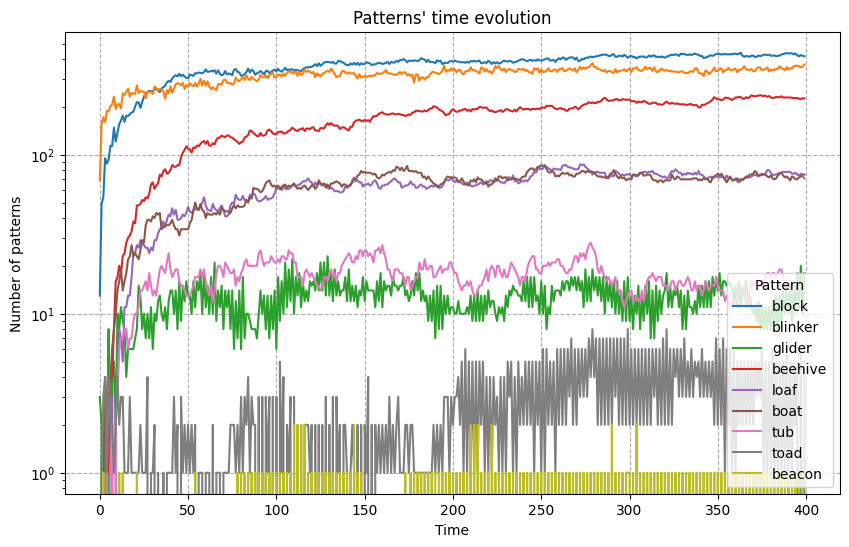

In [105]:
import pandas as pd
import os
BASE_DIR = "output_life"
PLOT_DIR = os.path.join(BASE_DIR, "plots")
DATA_DIR = os.path.join(BASE_DIR, "data")
plt.figure(figsize=(10,6))

for name, values in series.items():
    plt.plot(values, label=name)

plt.xlabel("Time")
plt.ylabel("Number of patterns")
plt.yscale('log')
plt.title("Patterns' time evolution")
plt.legend(title='Pattern')
plt.grid(True,linestyle='--')
plt.savefig(os.path.join(PLOT_DIR, f"patterntime_log_2.png"))
plt.show()


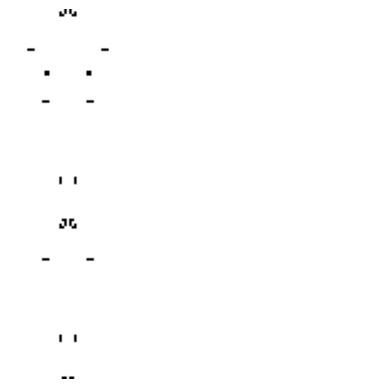

In [88]:
import numpy as np
import scipy.signal as scs
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
def next_generation(grid, boundary='wrap'):
    kernel = np.ones((3,3))
    kernel[1,1] = 0

    neighbours = scs.convolve2d(grid, kernel, mode='same', boundary=boundary)

    survive = (grid == 1) & ((neighbours == 2) | (neighbours == 3))
    born = (grid == 0) & (neighbours == 3)

    new_grid = np.zeros_like(grid)
    new_grid[survive | born] = 1

    return new_grid
def center_of_mass(world):
    coords = np.argwhere(world == 1)
    if len(coords) == 0:
        return None
    return coords.mean(axis=0)
def gosper_glider_gun(N=100):
    grid = np.zeros((N,N), dtype=int)

    
    # coordinate manuali standard
    coords = [
        (5,1),(5,2),(6,1),(6,2),
        (5,11),(6,11),(7,11),
        (4,12),(8,12),
        (3,13),(9,13),
        (3,14),(9,14),
        (6,15),
        (4,16),(8,16),
        (5,17),(6,17),(7,17),
        (6,18),
        (3,21),(4,21),(5,21),
        (3,22),(4,22),(5,22),
        (2,23),(6,23),
        (1,25),(2,25),(6,25),(7,25),
        (3,35),(4,35),(3,36),(4,36)
    ]

    for (i,j) in coords:
        grid[i+20,j+10] = 1

    return grid
def lwss():
    return np.array([
        [0,1,1,1,1],
        [1,0,0,0,1],
        [0,0,0,0,1],
        [1,0,0,1,0]
    ])

def puffer(N=120):
    grid = np.zeros((N,N), dtype=int)
    ship = lwss()
    grid[50:54, 10:15] = ship
    grid[50:54, 16:21] = ship
    return grid
def glider():
    return np.array([
        [0,1,0],
        [0,0,1],
        [1,1,1]
    ])

def rake(N=150):
    grid = np.zeros((N,N), dtype=int)

    g = glider()
    grid[60:63, 20:23] = g
    grid[64:67, 24:27] = g
    grid[68:71, 28:31] = g

    return grid
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
import numpy as np

import numpy as np
import numpy as np


import numpy as np

def custom_pattern(N=150):
    # Creo la griglia vuota
    grid = np.zeros((N, N), dtype=int)

    # Definisco il pattern da inserire
    pattern = [
        "011100000010000010000001110",
        "100100000111000111000001001",
        "000100001101000101100001000",
        "000100000000000000000001000",
        "000100100000000000001001000",
        "000100110000000000011001000",
        "001000110000000000011000100"
    ]

    # Converto il pattern in numeri interi e lo inserisco nella griglia
    pattern_array = np.array([[int(c) for c in row] for row in pattern])

    # Scegli dove posizionare il pattern nella griglia
    start_row, start_col = 10, 10  # puoi cambiare questi valori a piacere
    rows, cols = pattern_array.shape
    grid[start_row:start_row+rows, start_col:start_col+cols] = pattern_array

    return grid


world = np.zeros((1000,1000), dtype=int)

pentomino = np.array([[0,1,1],
                   [1,1,0],
                   [0,1,0]])
world[225:228,225:228] = pentomino
grid = np.zeros((150,150), dtype=int)
grid = custom_pattern(N=150)

fig, ax = plt.subplots()
img = ax.imshow(grid, cmap="binary")
ax.axis("off")
occupancy_history = []

def update(frame):
    global grid
    grid = next_generation(grid)
    occupancy_history.append(grid.mean())
    img.set_data(grid)
    return [img]

ani = FuncAnimation(fig,update,frames=1000,interval=100,blit=True)

HTML(ani.to_jshtml())

MOVEMENT OF THE CENTER MASS

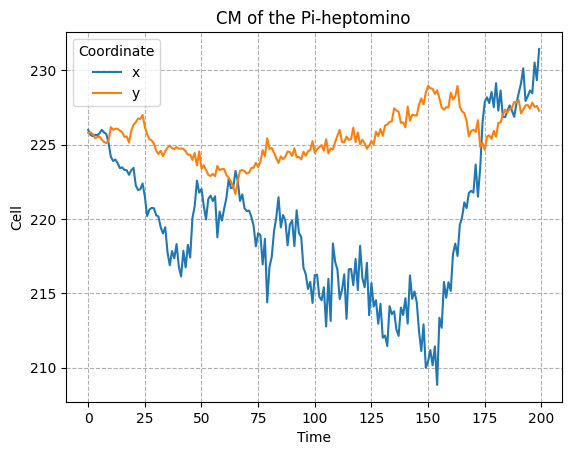

In [94]:
positions = []
world = np.zeros((1000,1000), dtype=int)

pentomino = np.array([[0,1,1],
                   [1,1,0],
                   [0,1,0]])
world[225:228,225:228] = pentomino
#world = custom_pattern(200)

for t in range(200):
    pos = center_of_mass(world)
    positions.append(pos)
    neighbours = scs.convolve2d(world, kernel, mode='same', boundary='wrap')
    world = evolve(world)

positions = np.array([p for p in positions if p is not None])

plt.plot(positions[:,1], label="x")
plt.plot(positions[:,0], label="y")
plt.legend(title='Coordinate')
plt.xlabel('Time')
plt.ylabel('Cell')
plt.title("CM of the Pi-heptomino")
plt.grid(True, linestyle='--')
plt.savefig(os.path.join(PLOT_DIR, f"cm_piheptomino.png"))
plt.show()

PATTERNS' OCCUPANCY

In [101]:
def evolution(world, neighbours):
    new_world = np.zeros_like(world)
    survive = (world == 1) & ((neighbours == 2) | (neighbours == 3))
    born = (world == 0) & (neighbours == 3)

    new_world[survive | born] = 1
    deaths = (world == 1) & (new_world == 0)
    
    return new_world, born.sum(), deaths.sum()


def simulate(world, T, boundary='wrap'):
    N = world.shape[0]
    kernel = np.ones((3,3))
    kernel[1,1] = 0

    alive_history = []
    born_history = []
    death_history = []

    for t in range(T):
        neighbours = scs.convolve2d(world, kernel, mode='same', boundary=boundary)
        world, born, deaths = evolution(world, neighbours)

        alive = world.sum()

        alive_history.append(alive)
        born_history.append(born)
        death_history.append(deaths)

    return world, alive_history, born_history, death_history

def run_life(T, seed=None, boundary='wrap'):
    if seed is not None:
        np.random.seed(seed)

    """world = np.zeros((1000,1000), dtype=int)

    pentomino = np.array([[0,1,1],
                       [1,1,0],
                       [0,1,0]])
    world[225:228,225:228] = pentomino
    """
    world=gosper_glider_gun(200)
    final, alive, born, death = simulate(world, T=T, boundary=boundary)

    alive = np.array(alive)
    occupancy = alive / (N*N)

    return occupancy
def ensemble_occupancy(T, runs=50, seed_base=42):
    occ_matrix = []

    for i in range(runs):
        seed = seed_base + i
        occ = run_life(T, seed=seed)
        occ_matrix.append(occ)

    occ_matrix = np.array(occ_matrix)

    mean_occ = occ_matrix.mean(axis=0)
    std_occ  = occ_matrix.std(axis=0)

    return mean_occ, std_occ


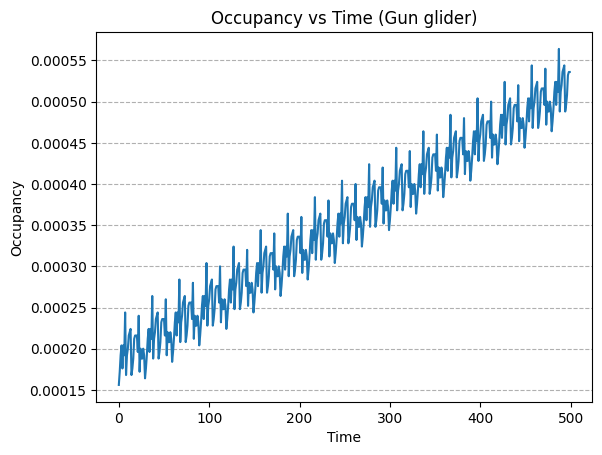

In [103]:
T = 500

mean_occ, std_occ = ensemble_occupancy(T)
plt.plot(mean_occ )

plt.title(f"Occupancy vs Time (Gun glider)")
plt.xlabel("Time")
plt.ylabel("Occupancy")

plt.grid(True, axis='y',linestyle='--')
plt.savefig(os.path.join(PLOT_DIR, f"Occupancyvstime-gun.png"))
plt.show()

COLLISIONS

In [ ]:
import numpy as np
import itertools
import pandas as pd
import matplotlib.pyplot as plt


def life_step(world):

    neighbors = sum(np.roll(np.roll(world,i,0),j,1)
                    for i in (-1,0,1)
                    for j in (-1,0,1)
                    if not (i==0 and j==0))

    birth = (neighbors==3) & (world==0)
    survive = ((neighbors==2)|(neighbors==3)) & (world==1)

    return (birth | survive).astype(int)


def place_pattern(world, pattern, x, y):

    h,w = pattern.shape
    world[x:x+h, y:y+w] |= pattern


def simulate(world, T):

    states = [world.copy()]
    live_cells = [world.sum()]

    for _ in range(T):

        world = life_step(world)

        states.append(world.copy())
        live_cells.append(world.sum())

    return states, live_cells


def classify_evolution(states):

    final = states[-1]

    if final.sum() == 0:
        return "annihilation"

    # stable
    if np.array_equal(states[-1], states[-2]):
        return "stable"

    # oscillator
    for p in range(2,10):
        if len(states) > p:
            if np.array_equal(states[-1], states[-1-p]):
                return f"oscillator_p{p}"

    # spaceship detection
    for dx in range(-3,4):
        for dy in range(-3,4):

            shifted = np.roll(np.roll(states[-5],dx,0),dy,1)

            if np.array_equal(states[-1], shifted):
                return "spaceship"

    return "chaotic"


def run_collision(patternA, patternB, dx, dy,world_size=80,steps=200):

    world = np.zeros((world_size,world_size),dtype=int)

    cx = world_size//2
    cy = world_size//2

    place_pattern(world, patternA, cx, cy)
    place_pattern(world, patternB, cx+dx, cy+dy)

    states, live_series = simulate(world, steps)

    result = classify_evolution(states)

    return result, states[-1], live_series


def search_collisions(patterns,offsets=range(-10,11),steps=200):

    results = []

    names = list(patterns.keys())

    for nameA, nameB in itertools.combinations(names,2):

        patA = patterns[nameA]
        patB = patterns[nameB]

        for dx in offsets:
            for dy in offsets:

                if dx==0 and dy==0:
                    continue

                result, final, live_series = run_collision(patA,patB,dx,dy,steps=steps)

                results.append({
                    "patternA":nameA,
                    "patternB":nameB,
                    "dx":dx,
                    "dy":dy,
                    "result":result,
                    "final_cells":final.sum(),
                    "peak_cells":max(live_series)
                })

    return pd.DataFrame(results)


patterns = {

"block":np.array([
[1,1],
[1,1]
]),

"blinker":np.array([
[1,1,1]
]),

"glider":np.array([
[0,1,0],
[0,0,1],
[1,1,1]
]),

"beehive":np.array([
[0,1,1,0],
[1,0,0,1],
[0,1,1,0]
])

}

df = search_collisions(patterns,offsets=range(-8,9),steps=150)

df.to_csv("collision_results.csv",index=False)

print("CSV salvato: collision_results.csv")
print(df.head())



In [ ]:

plt.figure()

df["result"].value_counts().plot(kind="bar")

plt.title("Collision Outcomes")
plt.xlabel("Result type")
plt.ylabel("Count")
plt.grid(True,axis='y',linestyle='--')
plt.savefig(os.path.join(PLOT_DIR, f"collision outcome.png"))

plt.show()


subset = df[df.patternA=="glider"]

pivot = subset.pivot_table(index="dx",columns="dy",values="final_cells",aggfunc="mean")

plt.figure()

plt.imshow(pivot,origin="lower")
plt.colorbar(label="Final live cells")

plt.title("Collision map (glider vs others)")
plt.xlabel("dy")
plt.ylabel("dx")
plt.savefig(os.path.join(PLOT_DIR, f"cmap_glider.png"))

plt.show()

subset = df[df.patternA=="block"]

pivot = subset.pivot_table(index="dx",columns="dy",values="final_cells",aggfunc="mean")

plt.figure()

plt.imshow(pivot,origin="lower")
plt.colorbar(label="Final live cells")

plt.title("Collision map (block vs others)")
plt.xlabel("dy")
plt.ylabel("dx")
plt.savefig(os.path.join(PLOT_DIR, f"cmap_block.png"))

plt.show()
subset = df[df.patternA=="block"]

pivot = subset.pivot_table(index="dx",columns="dy",values="final_cells",aggfunc="mean")

plt.figure()

plt.imshow(pivot,origin="lower")
plt.colorbar(label="Final live cells")

plt.title("Collision map (block vs others)")
plt.xlabel("dy")
plt.ylabel("dx")
plt.savefig(os.path.join(PLOT_DIR, f"cmap_block.png"))

plt.show()


subset = df[df.patternA=="blinker"]

pivot = subset.pivot_table(index="dx",columns="dy",values="final_cells",aggfunc="mean")

plt.figure()

plt.imshow(pivot,origin="lower")
plt.colorbar(label="Final live cells")

plt.title("Collision map (blinker vs others)")
plt.xlabel("dy")
plt.ylabel("dx")
plt.savefig(os.path.join(PLOT_DIR, f"cmap_blinker.png"))

plt.show()

plt.figure()

plt.hist(df["final_cells"],bins=20)

plt.title("Distribution of surviving cells")
plt.xlabel("Cells alive")
plt.ylabel("Frequency")
plt.grid(True,axis='y',linestyle='--')
plt.savefig(os.path.join(PLOT_DIR, f"distribution_cells.png"))

plt.show()